# Introduction

The project aims to explore the restaurant market in Moscow as of summer 2022 to select the most profitable location and prices before opening a restaurant by the "Shut Up and Take My Money" fund. To achieve the project's goals, data preprocessing and analysis of data on addresses, average checks, categories, and ratings of establishments will be conducted. A detailed study of coffee shops will also be carried out, determining the distribution of ratings, districts, and the average cost of a cup of coffee. At the end of the project, a final conclusion will be drawn.

The data from Yandex Maps and Yandex Business will be used. The dataset contains 14 columns and 8406 rows. The columns contain the following information:

1) name - the name of the establishment;
2) address - the address of the establishment;
3) category - the category of the establishment, such as "cafe", "pizza place", or "coffee shop";
4) hours - information about the days and hours of operation;
5) lat - the latitude of the geographical point where the establishment is located;
6) lng - the longitude of the geographical point where the establishment is located;
7) rating - the rating of the establishment based on user ratings in Yandex Maps (the highest rating is 5.0);
8) price - the price category in the establishment, such as "average", "below average", "above average", etc.;
9) avg_bill - a string that stores the average order amount in the format of a range, for example:
   - "Average bill: 1000–1500 ₽";
   - "Price of a cup of cappuccino: 130–220 ₽";
   - "Price of a glass of beer: 400–600 ₽";
   - and so on;
10) middle_avg_bill - a number with an estimate of the average check, which is only indicated for values from the avg_bill column that start with the substring "Average bill":
    - If the string specifies a price range of two values, the median of these two values will be included in the column.
    - If the string specifies a single number - a price without a range, then this number will be included in the column.
    - If there is no value or it does not start with the substring "Average bill", then nothing will be included in the column.
11) middle_coffee_cup - a number with an estimate of the price of one cup of cappuccino, which is only indicated for values from the avg_bill column that start with the substring "Price of one cup of cappuccino":
    - If the string specifies a price range of two values, the median of these two values will be included in the column.
    - If the string specifies a single number - a price without a range, then this number will be included in the column.
    - If there is no value or it does not start with the substring "Price of one cup of cappuccino", then nothing will be included in the column.
12) chain - a number expressed as 0 or 1, indicating whether the establishment is a chain (there may be errors for small chains):
    - 0 - the establishment is not part of a chain
    - 1 - the establishment is part of a chain
13) district - the administrative district in which the establishment is located, for example, the Central Administrative District;
14) seats - the number of seats.

# Step 1. Imports and Data Upload

In [1]:
import pandas as pd
from folium import Marker, Map, Choropleth, Figure
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
import plotly.io as pio
import seaborn as sns
import warnings

In [2]:
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
pio.renderers.default = "png"

In [4]:
data = pd.read_csv('./datasets/moscow_places.csv')

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Column types comply with data

In [6]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


# Step 2. Data Preprocessing

## Duplicates

To find out how many unique establishments are represented in the data, let's first check for duplicates.

Since establishments may have the same names, we'll check for duplicates based on a pair of columns containing the name and address.

In [7]:
data[['name', 'address']].duplicated().sum()

0

There are no obvious duplicates in the data. Let's check the column containing the names for implicit duplicates, such as those differing only in case or whitespace. Then we'll proceed to check for missing data.

In [8]:
data['name_lower_trim'] = data['name'].str.lower().str.strip()
data[['name_lower_trim', 'address']].duplicated().sum()

3

After processing the case and whitespace, 3 duplicates were found based on the address and name.

In [9]:
data[data[['name_lower_trim', 'address']].duplicated() == True]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_lower_trim
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,more poke
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,раковарня клешни и хвосты
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,хлеб да выпечка


In [10]:
data[data['name_lower_trim'] == 'more poke']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_lower_trim
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,more poke
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,more poke
6088,More Poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN,more poke


In [11]:
data[data['name_lower_trim'] == 'раковарня клешни и хвосты']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_lower_trim
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,раковарня клешни и хвосты
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,раковарня клешни и хвосты
7270,Раковарня Клешни и хвосты,"бар,паб","Москва, Братиславская улица, 12",Юго-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.659744,37.752984,4.9,средние,Цена бокала пива:150–250 ₽,NaN,NaN,1,40.0,раковарня клешни и хвосты


In [12]:
data[data['name_lower_trim'] == 'хлеб да выпечка']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_lower_trim
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0,хлеб да выпечка
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,хлеб да выпечка
7937,Хлеб да Выпечка,кофейня,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,NaN,NaN,NaN,NaN,1,NaN,хлеб да выпечка


Duplicates are detected. Note that each of these establishments appears in the dataset more than twice, but only 2 are located at the same address. It can be inferred that these establishments are part of a chain, so we will delete duplicates where the chain value is equal to zero.

In [13]:
data = data.drop([1430, 2211, 3109]).reset_index(drop=True)

In [14]:
data = data.drop('name_lower_trim', axis=1)
len(data)

8403

Since each record in the data represents one establishment, the number of unique establishments is equal to the number of rows after removing duplicates - 8403.

Before filling in missing values, let's check the data for any anomalous values.

## Anomalous Values

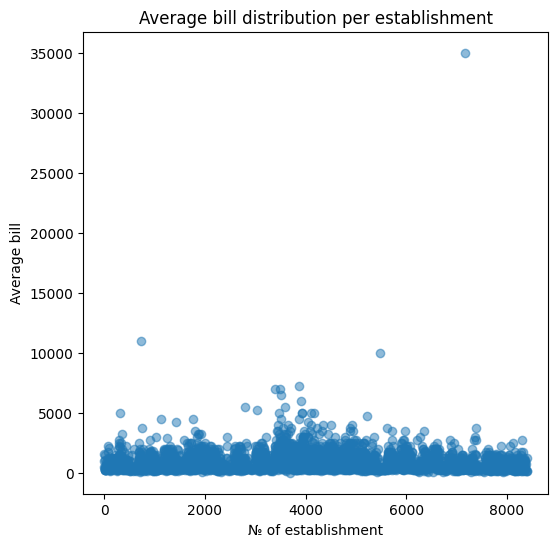

In [15]:
plt.figure(figsize=(6, 6))
plt.scatter(range(len(data['middle_avg_bill'])), data['middle_avg_bill'], alpha=0.5)
plt.title('Average bill distribution per establishment')
plt.ylabel('Average bill')
plt.xlabel('№ of establishment')
plt.show()

There is a venue with an average bill of 35000 rubles. Such a value is quite realistic, albeit high. Now let's examine the lower boundary.

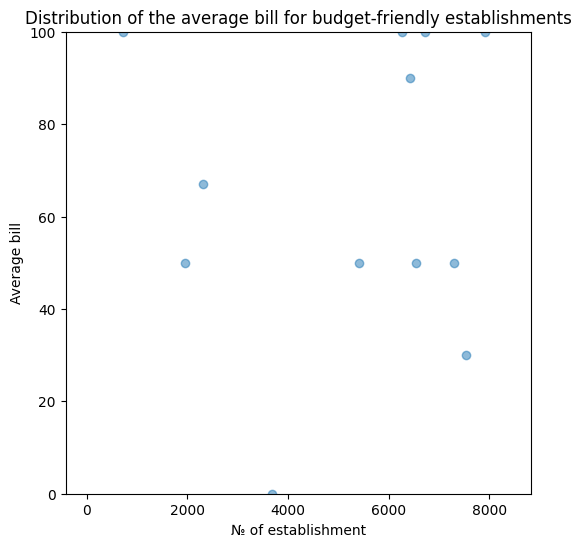

In [16]:
plt.figure(figsize=(6, 6))
plt.scatter(range(len(data['middle_avg_bill'])), data['middle_avg_bill'], alpha=0.5)
plt.ylim(0, 100)
plt.title('Distribution of the average bill for budget-friendly establishments')
plt.ylabel('Average bill')
plt.xlabel('№ of establishment')
plt.show()

An average check of 0 rubles raises suspicions. Let's see what this place is.

In [17]:
data[data['middle_avg_bill'] == 0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3685,Кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0


It's unlikely that "Coffeemania" on Arbat started giving away food for free. Let's look at the average check in other establishments of the chain and handle the anomalous value.

In [18]:
data.loc[data['name'] == 'Кофемания'].head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1377,Кофемания,кофейня,"Москва, Ленинградское шоссе, 16Ас4",Северный административный округ,"ежедневно, 09:00–23:00",55.822030,37.496661,4.4,высокие,Средний счёт:1400 ₽,1400.0,NaN,1,NaN
1450,Кофемания,кофейня,"Москва, Хорошёвское шоссе, 27",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.777620,37.523223,4.4,высокие,Средний счёт:1500–2500 ₽,2000.0,NaN,1,45.0
1789,Кофемания,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,1,15.0
1869,Кофемания,кофейня,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,"пн-пт 09:00–22:00; сб,вс 10:00–22:00",55.780074,37.592099,4.4,средние,Средний счёт:700–1400 ₽,1050.0,NaN,1,500.0
1882,Кофемания,кофейня,"Москва, Лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,140.0


As expected, the dataset contains data on the average check in other establishments of the chain. Let's replace the anomalous value with the median across the chain. This approach can also be used to handle missing values later on.

In [19]:
data.loc[data['middle_avg_bill'] == 0, 'avg_bill'] = f"Средний счёт:{int(data.loc[data['name'] == 'Кофемания', 'middle_avg_bill'].median())} ₽"
data.loc[data['middle_avg_bill'] == 0, 'middle_avg_bill'] = data.loc[data['name'] == 'Кофемания', 'middle_avg_bill'].median()

The anomalous value has been handled. Now, let's examine anomalies in "middle_coffee_cup" and "seats".

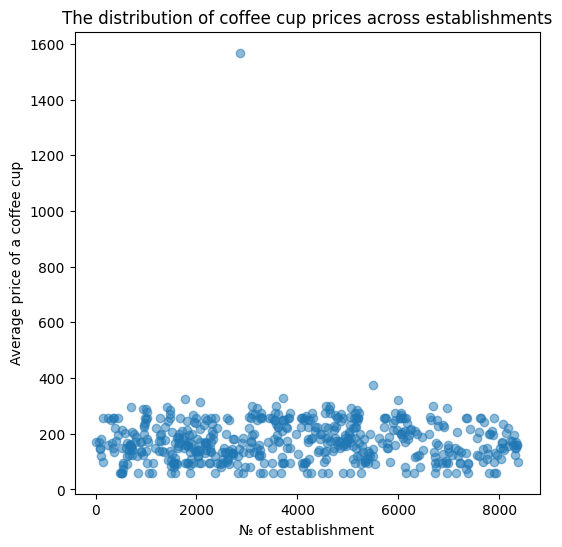

In [20]:
plt.figure(figsize=(6, 6))
plt.scatter(range(len(data['middle_coffee_cup'])), data['middle_coffee_cup'], alpha=0.5)
plt.title('The distribution of coffee cup prices across establishments')
plt.ylabel('Average price of a coffee cup')
plt.xlabel('№ of establishment')
plt.show()

There is an outlier - in one of the establishments, they charge almost 1600 rubles for a coffee cup. Let's take a look at it.

In [21]:
data[data['middle_coffee_cup'] == data['middle_coffee_cup'].max()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2857,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


"Shokoladnitsa" on Bolshaya Semyonovskaya serves coffee for connoisseurs. Alternatively, there might be an error in the data. Let's look at other establishments in the chain and find out.

In [22]:
data[data['name'] == 'Шоколадница'].head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
151,Шоколадница,кофейня,"Москва, Дмитровское шоссе, 163Ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.910447,37.542227,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,NaN
240,Шоколадница,кофейня,"Москва, Широкая улица, 13А",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.887990,37.662485,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,75.0
343,Шоколадница,кофейня,"Москва, Фестивальная улица, 13, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.855703,37.477670,4.3,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,100.0
360,Шоколадница,кофейня,"Москва, Сходненская улица, 25",Северо-Западный административный округ,"ежедневно, 08:00–23:00",55.846066,37.438897,4.3,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,130.0
381,Шоколадница,кофейня,"Москва, Сходненская улица, 56",Северо-Западный административный округ,"ежедневно, 10:00–22:00",55.850700,37.443523,4.3,NaN,NaN,NaN,NaN,1,140.0


The chain maintains fairly stable prices. As with "Coffeemania," let's replace the anomaly with the median.

In [23]:
data.loc[data['middle_coffee_cup'] == 1568, 'avg_bill'] = "Цена чашки капучино:239–274 ₽"
data.loc[data['middle_coffee_cup'] == 1568, 'middle_coffee_cup'] = data.loc[data['name'] == 'Шоколадница', 'middle_coffee_cup'].median()

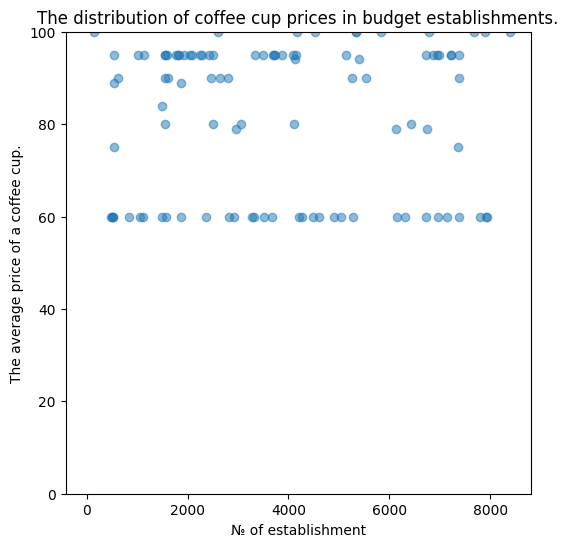

In [24]:
plt.figure(figsize=(6, 6))
plt.scatter(range(len(data['middle_coffee_cup'])), data['middle_coffee_cup'], alpha=0.5)
plt.title('The distribution of coffee cup prices in budget establishments.')
plt.ylabel('The average price of a coffee cup.')
plt.xlabel('№ of establishment')
plt.ylim(0, 100)
plt.show()

The lower boundary of the coffee price is fine - the minimum value is 60 rubles.

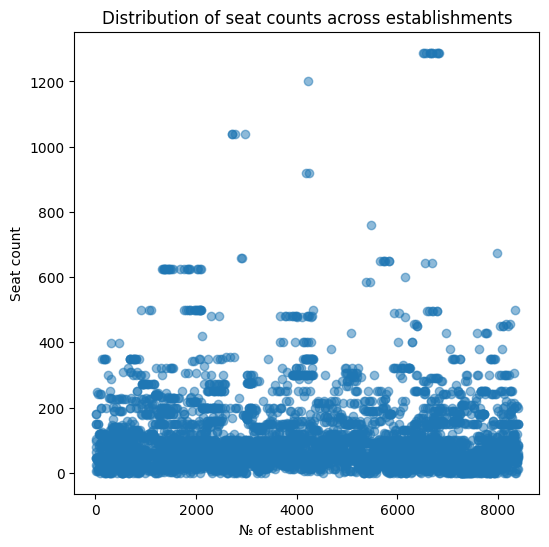

In [25]:
plt.figure(figsize=(6, 6))
plt.scatter(range(len(data['seats'])), data['seats'], alpha=0.5)
plt.title('Distribution of seat counts across establishments')
plt.ylabel('Seat count')
plt.xlabel('№ of establishment')
plt.show()

Some establishments have over 1000 seats. Let's examine them in more detail.

In [26]:
data[data['seats'] > 1000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2711,Ваня и Гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 11:00–06:00",55.789842,37.750282,4.2,высокие,Средний счёт:1000–2500 ₽,1750.0,NaN,0,1040.0
2720,Маргарита,быстрое питание,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 10:00–22:00",55.789527,37.752004,4.3,NaN,NaN,NaN,NaN,1,1040.0
2768,Шоколадница,кофейня,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00...",55.789903,37.749822,4.1,NaN,NaN,NaN,NaN,1,1040.0
2964,Матрешка,кафе,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,NaN,55.789867,37.749656,4.0,NaN,NaN,NaN,NaN,0,1040.0
4228,РестоБар Argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,Средний счёт:2500–5000 ₽,3750.0,NaN,0,1200.0
6515,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0
6521,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0
6571,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0
6638,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0
6655,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0


Several establishments on Vernadsky Avenue and Izmailovsky Highway share the same high number of seats. This can happen if they are, for example, located inside a large food mall. Since there are no grounds to consider these values as anomalies, let's leave them as they are.

## Missing Values

In [27]:
price_na_before = data['price'].isna().sum()
avg_na_before = data['avg_bill'].isna().sum()
middle_na_before = data['middle_avg_bill'].isna().sum()
coffee_na_before = data['middle_coffee_cup'].isna().sum()
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

There are missing values in 6 columns of the dataframe:
- Missing values in the "hours" column cannot be filled because this data cannot be recovered.
- For the "middle_avg_bill" and "middle_coffee_cup" columns, we will fill in the missing values for network locations using data from other establishments within the same network, as average bills within networks in the same city usually do not differ.
- By handling missing values in "middle_avg_bill" and "middle_coffee_cup," we can also fill in some missing values in "avg_bill."
- We will try to fill in some missing values in the "price" column using data from the "middle_avg_bill" column.
- It is impossible to restore information about the "seats" column.

In [28]:
data.loc[data['chain'] == 1, 'name'].nunique()

762

The data represents 762 chains of establishments.

In [29]:
for ch in data.loc[data['chain'] == 1, 'name'].unique().tolist():
    if data.loc[data['name'] == ch, 'middle_avg_bill'].isna().sum() < len(data.loc[data['name'] == ch, 'middle_avg_bill']):
        data.loc[data['name'] == ch, 'avg_bill'] = data.loc[data['name'] == ch, 'avg_bill'].fillna(f"Средний счёт:{int(data.loc[data['name'] == ch, 'middle_avg_bill'].median())} ₽")
        data.loc[data['name'] == ch, 'middle_avg_bill'] = data.loc[data['name'] == ch, 'middle_avg_bill'].fillna(data.loc[data['name'] == ch, 'middle_avg_bill'].median())
    if data.loc[data['name'] == ch, 'middle_coffee_cup'].isna().sum() < len(data.loc[data['name'] == ch, 'middle_coffee_cup']):
        data.loc[data['name'] == ch, 'avg_bill'] = data.loc[data['name'] == ch, 'avg_bill'].fillna(f"Цена чашки капучино:{int(data.loc[data['name'] == ch, 'middle_coffee_cup'].median())} ₽")
        data.loc[data['name'] == ch, 'middle_coffee_cup'] = data.loc[data['name'] == ch, 'middle_coffee_cup'].fillna(data.loc[data['name'] == ch, 'middle_coffee_cup'].median())

Some missing values in the columns "avg_bill," "middle_avg_bill," and "middle_coffee_cup" have been filled using data from chain establishments.

In [30]:
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In the "price" column, there are 4 price categories. Let's find the existing boundaries of these categories and fill in the missing values accordingly.

In [31]:
for cat in ['низкие', 'средние', 'выше среднего', 'высокие']:
    category_max = data.loc[data["price"] == cat, "middle_avg_bill"].max()
    print(f'The upper boundary of the category {cat}: {category_max}')
    data.loc[data['middle_avg_bill'] <= category_max, 'price'] = data.loc[data['middle_avg_bill'] <= category_max, 'price'].fillna(cat)

The upper boundary of the category низкие: 650.0
The upper boundary of the category средние: 2150.0
The upper boundary of the category выше среднего: 4500.0
The upper boundary of the category высокие: 35000.0


In [32]:
data['price'].isna().sum()

3914

Some missing values in the "price" column were filled using data from the "middle_avg_bill" column.

In [33]:
print('Missing values in price before preprocessing:', price_na_before)
print('Missing values in price after preprocessing:', data['price'].isna().sum())
print()
print('Missing values in avg_bill before preprocessing:', avg_na_before)
print('Missing values in avg_bill after preprocessing:', data['avg_bill'].isna().sum())
print()
print('Missing values in middle_avg_bill before preprocessing:', middle_na_before)
print('Missing values in middle_avg_bill after preprocessing:', data['middle_avg_bill'].isna().sum())
print()
print('Missing values in middle_coffee_cup before preprocessing:', coffee_na_before)
print('Missing values in middle_coffee_cup after preprocessing:', data['middle_coffee_cup'].isna().sum())

Missing values in price before preprocessing: 5088
Missing values in price after preprocessing: 3914

Missing values in avg_bill before preprocessing: 4587
Missing values in avg_bill after preprocessing: 3669

Missing values in middle_avg_bill before preprocessing: 5254
Missing values in middle_avg_bill after preprocessing: 4422

Missing values in middle_coffee_cup before preprocessing: 7868
Missing values in middle_coffee_cup after preprocessing: 7558


## Adding Columns

In [34]:
data['street'] = data['address'].str.split(',').str[1].str[1:]

In [35]:
data['street'].head()

0              улица Дыбенко
1              улица Дыбенко
2         Клязьминская улица
3    улица Маршала Федоренко
4        Правобережная улица
Name: street, dtype: object

In [36]:
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'
data['is_24/7'].sum()

730

There are 730 establishments operating 24/7 represented in the data.

## Preprocessing Results

As a result of data preprocessing, 3 implicit duplicates were removed, 2 anomalous values were handled, and some missing values in the columns "price," "avg_bill," "middle_avg_bill," and "middle_coffee_cup" were filled.

Additionally, columns for the street name and indicators for daily and 24/7 operation were added to the data. Now we can proceed with data analysis.

# Step 3. Data Analysis

## Establishment Categories

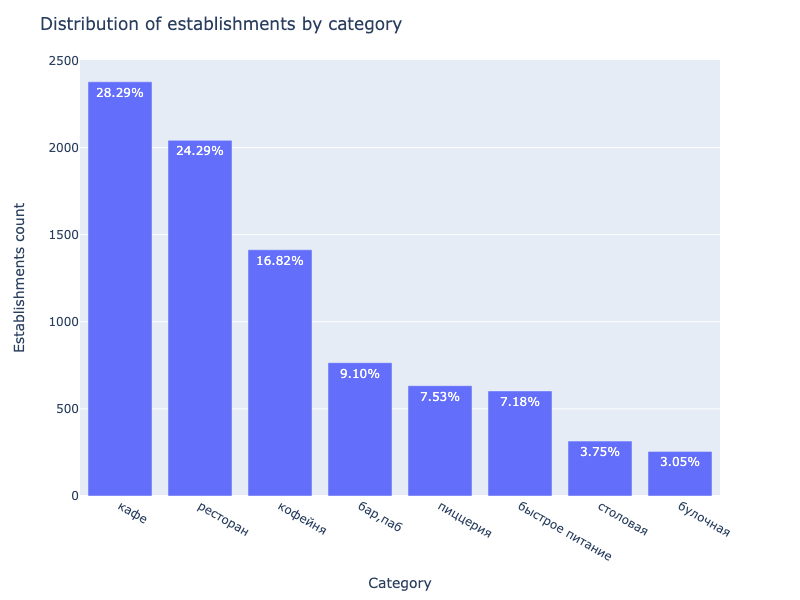

In [37]:
category_count = data['category'].value_counts()
fig = px.bar(category_count,
             y=category_count,
             text=category_count / sum(category_count) * 100)
fig.update_layout(title='Distribution of establishments by category',
                  xaxis_title='Category',
                  yaxis_title='Establishments count',
                  width=800,
                  height=600)
fig.update_traces(texttemplate='%{text:.2f}%', textposition='inside')
fig.show()

Cafés and restaurants are the most popular establishment categories, with each having over 2000 seats (28.3% and 24.3% of the total, respectively). Coffee shops follow closely behind, with just under 1500 seats (16.8%). After coffee shops, there are establishments significantly less popular, such as bars, pubs, pizzerias, and fast food outlets, each with fewer than 800 seats. Canteens and bakeries are the least numerous, with no more than 500 each (less than 4% of all establishments) in each category.

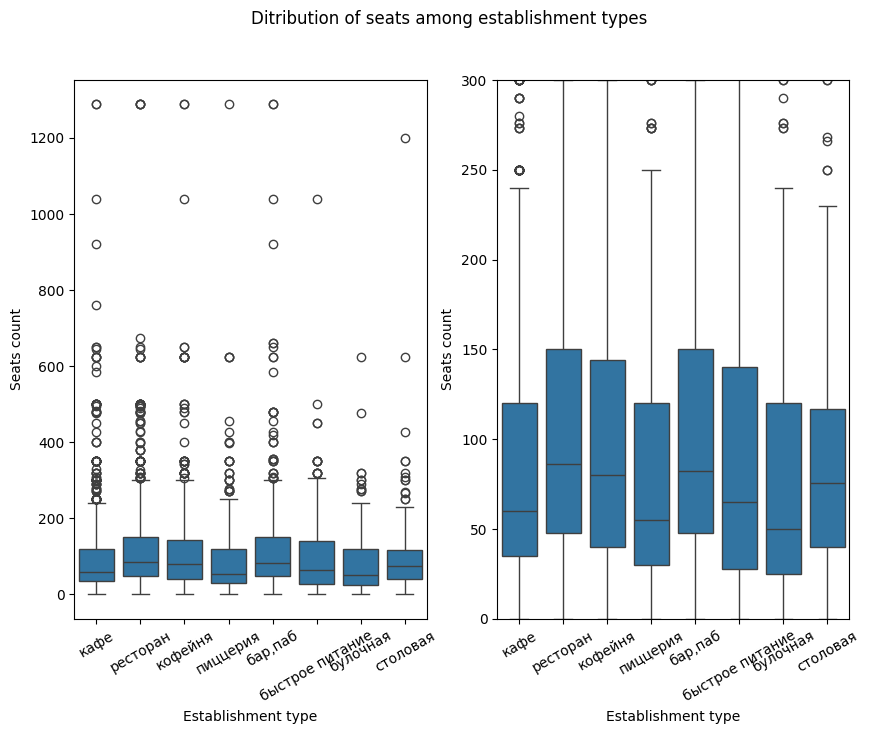

In [38]:
plt.figure(figsize=(10, 7))
sns.boxplot(data=data, x='category', y='seats', ax=plt.subplot(1, 2, 1))
plt.ylabel('Seats count')
plt.xlabel('Establishment type')
plt.xticks(rotation=30)
sns.boxplot(data=data, x='category', y='seats', ax=plt.subplot(1, 2, 2))
plt.ylabel('Seats count')
plt.xlabel('Establishment type')
plt.xticks(rotation=30)
plt.ylim(0, 300)
plt.suptitle('Ditribution of seats among establishment types')
plt.show()

On average, restaurants, bars, pubs, and coffee shops have the largest number of seats, with a median of around 75 seats. Next are canteens and fast food establishments, with a median of over 60 seats. Following them are bakeries, cafes, and pizzerias, with a median number of seats just over 50.

## Chain Establishments Analysis

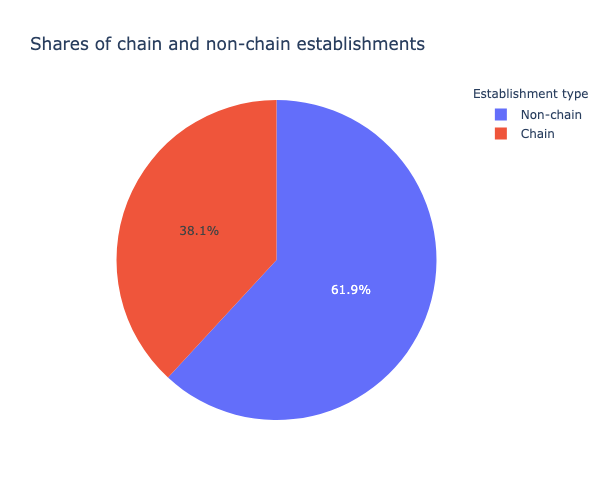

In [39]:
chain_count = data['chain'].value_counts()
fig1 = go.Figure(data=[go.Pie(labels=['Non-chain', 'Chain'], 
                             values=chain_count)])
fig1.update_layout(title='Shares of chain and non-chain establishments',
                  width=600,
                  height=500,
                  annotations=[dict(x=1.30,
                                    y=1.05,
                                    text='Establishment type',
                                    showarrow=False)])
fig1.show()

The dataset contains more non-chain establishments. Their share is 61.9% (5198), while the chain establishments account for 38.1% (3205).

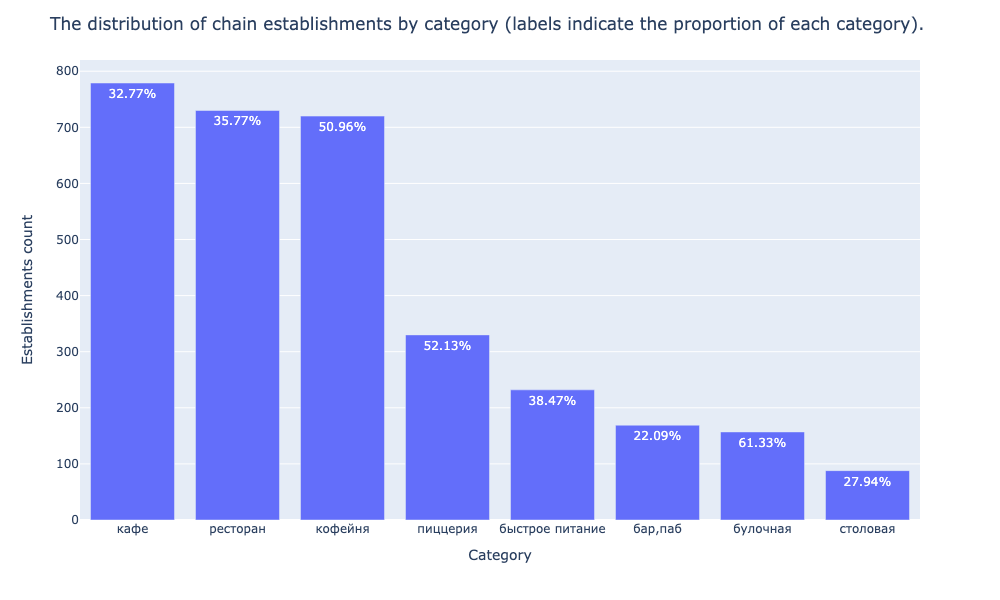

In [40]:
chain_categories = (data
                    .loc[data['chain'] == 1]
                    .groupby('category', as_index=False)['name']
                    .count()
                    .sort_values(by='name', ascending=False))
chain_categories = chain_categories.merge(category_count,
                                          left_on='category',
                                          right_on=category_count.index)
fig2 = px.bar(chain_categories,
              x='category',
              y='name',
              text=chain_categories['name'] / chain_categories['count'] * 100)
fig2.update_layout(title='The distribution of chain establishments by category (labels indicate the proportion of each category).',
                   xaxis_title='Category',
                   yaxis_title='Establishments count',
                   width=1000,
                   height=600)
fig2.update_traces(texttemplate='%{text:.2f}%', textposition='inside')
fig2.show()

There are three most popular types of chain establishments - cafes, restaurants, and coffee shops.
It is worth noting that among coffee shops and pizzerias, chain establishments account for over 50%, and among bakeries - over 60%.

In [41]:
top_chains = (data
              .groupby('name')
              .agg({'name': 'count', 'category': 'first'})
              .rename(columns={'name': 'count'})
              .sort_values(by='count', ascending=False))
top_chains.head(15)

,count,category
name,,
Кафе,189,кафе
Шоколадница,120,кофейня
Домино'с Пицца,76,пиццерия
Додо Пицца,74,пиццерия
One Price Coffee,71,кофейня
Яндекс Лавка,69,ресторан
Cofix,65,кофейня
Prime,50,ресторан
Хинкальная,44,быстрое питание


The data on the most popular chains includes establishments grouped under generic names such as "Cafe," "Khinkalnaya," "Shawarma," etc. Since they do not represent unified chains, let's remove them from the result.

In [42]:
top_chains = top_chains.drop(["Кафе", "Хинкальная", "Шаурма", "Ресторан", "Столовая"]).head(15)
top_chains

,count,category
name,,
Шоколадница,120,кофейня
Домино'с Пицца,76,пиццерия
Додо Пицца,74,пиццерия
One Price Coffee,71,кофейня
Яндекс Лавка,69,ресторан
Cofix,65,кофейня
Prime,50,ресторан
КОФЕПОРТ,42,кофейня
Кулинарная лавка братьев Караваевых,39,кафе


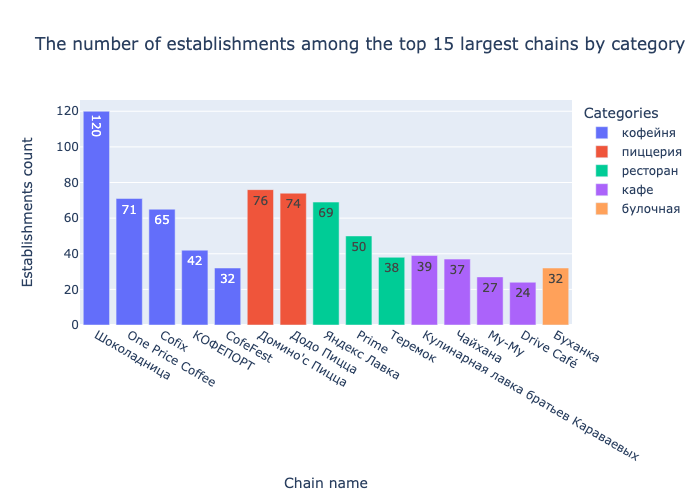

In [43]:
fig3 = px.bar(top_chains,
             x=top_chains.index,
             y='count',
             color='category',
             title='The number of establishments among the top 15 largest chains by category',
             text='count')
fig3.update_layout(xaxis_title='Chain name',
                  yaxis_title='Establishments count',
                  legend_title='Categories')
fig3.show()

Among the largest chains, coffee shops are the most prevalent. The most popular among them is "Shokoladnitsa," with 120 establishments. Also notable are the coffee shops "One Price Coffee" and "Cofix" (71 and 65 establishments, respectively).

Among the top 15 chains, there are also 2 pizzerias: "Domino's" and "Dodo" (76 and 74 establishments, respectively).

There are also restaurants present - "Yandex Lavka," "Prime," "Teremok."

In the data on the largest chains, there are 4 cafes, with the number of establishments ranging from 24 to 39: "Kulinarnaya Lavka Brat'ev Karavaevykh," "Chaykhana," "Mu-Mu," "Drive Cafe."

Among the chains, there is one bakery - "Bukhanka," which has 32 establishments.

## Rating and Location Analysis

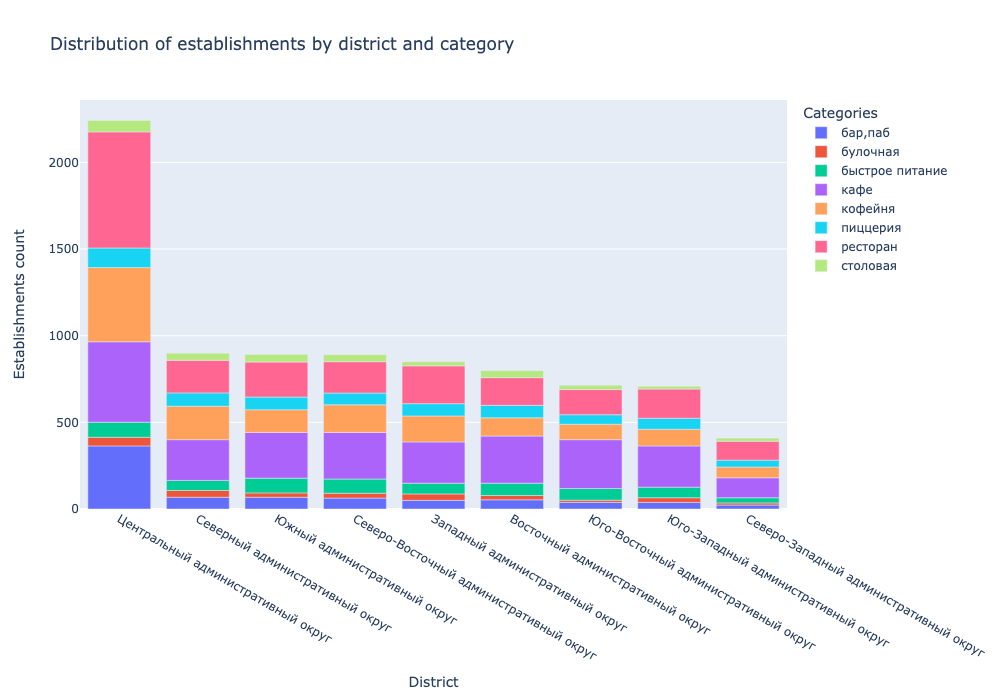

In [44]:
district_totals = data.groupby('district', as_index=False)['name'].count().sort_values(by='name', ascending=False)
district_count = data.groupby(['district', 'category'], as_index=False).agg({'name': 'count'})
fig4 = px.bar(district_count,
             x='district',
             y='name',
             color='category',
             category_orders={'district': district_totals['district'].tolist()},
             title='Distribution of establishments by district and category')
fig4.update_layout(xaxis_title='District',
                  yaxis_title='Establishments count',
                  width=1000,
                  height=700,
                  legend_title='Categories')
fig4.show()

The largest number of establishments is located in the Central Administrative District (ЦАО) - there are over 2300 of them. Another feature of this district is the high proportion of bars and pubs, while in other districts, there are significantly fewer of them.

Cafes and restaurants are widespread in all districts, with coffee shops also present in slightly smaller numbers. The share of other categories is significantly smaller.

The Eastern, Western, Northern, North-Eastern, and Southern Administrative Districts (ВАО, ЗАО, САО, СВАО, and ЮАО) have over 750 establishments each. In districts such as the South-Eastern and South-Western (ЮВАО and ЮЗАО), there are about 700 establishments. The smallest number of establishments is in the North-Western Administrative District (СЗАО) - it is the only district where there are fewer than 500 establishments.

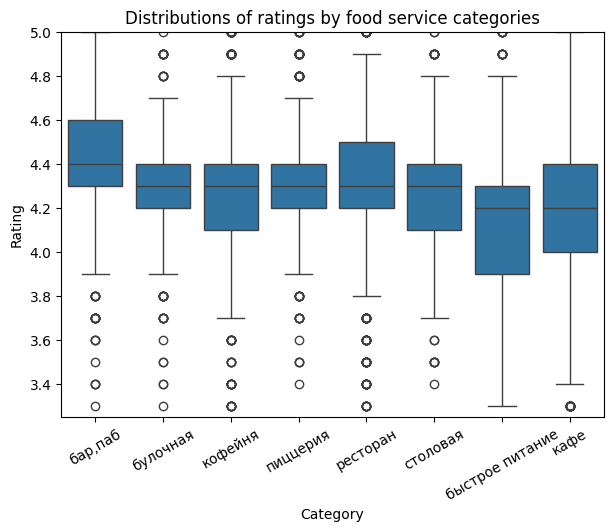

In [45]:
plt.figure(figsize=(7, 5))
sorted_categories = data.groupby('category')['rating'].median().sort_values(ascending=False).index
sns.boxplot(data=data,
            x='category',
            y='rating',
            order=sorted_categories)
plt.title('Distributions of ratings by food service categories')
plt.xlabel('Category')
plt.ylabel('Rating')
plt.xticks(rotation=30)
plt.ylim(3.25, 5)
plt.show()

On average, the lowest ratings are observed in fast food establishments and cafes, where the median rating is around 4.2. In restaurants, coffee shops, pizzerias, bakeries, and canteens, the median rating is 4.3. Bars and pubs have the highest median rating of 4.4. It can be concluded that the average ratings of establishments vary slightly.

In [46]:
state_geo = './datasets/admin_level_geomap.geojson'

In [47]:
moscow_lat, moscow_lng = 55.751244, 37.618423

f = Figure(width=800, height=600)
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron').add_to(f)

Choropleth(
    geo_data=state_geo,
    data=data.groupby('district', as_index=False)['rating'].agg('median'),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Median establishment rating by district',
).add_to(m)

m

The highest median rating of establishments, 4.4, is observed in the Central Administrative District (ЦАО). The South-Eastern and North-Eastern Administrative Districts (ЮВАО and СВАО) have ratings of approximately 4.2. The ratings for other districts range from around 4.23 to 4.27.

Establishments in the city center are more popular.

In [48]:
f1 = Figure(width=800, height=600)
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron').add_to(f1)
marker_cluster = MarkerCluster().add_to(m1)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m1

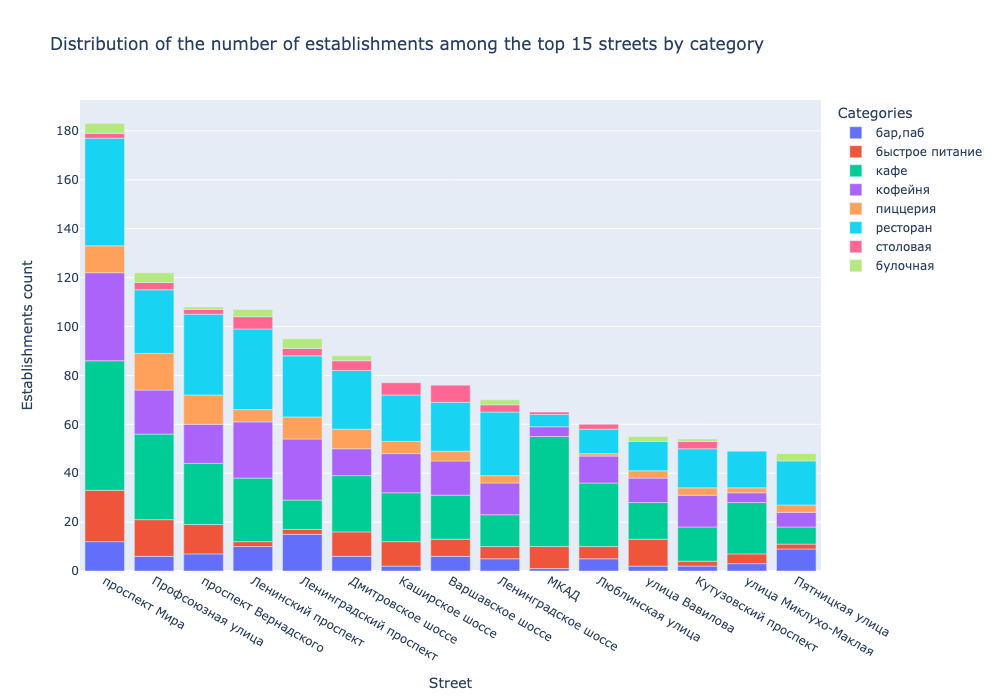

In [49]:
top_streets = (data
               .groupby('street', as_index=False)['name']
               .count()
               .sort_values(by='name', ascending=False)
               .head(15)
               .reset_index(drop=True))
top_streets_count = (data[data['street'].isin(top_streets['street']) == True]
                     .groupby(['street', 'category'], as_index=False)['name']
                     .count())
fig5 = px.bar(top_streets_count,
             x='street',
             y='name',
             color='category',
             category_orders={'street': top_streets['street'].tolist()},
             title='Distribution of the number of establishments among the top 15 streets by category')
fig5.update_layout(xaxis_title='Street',
                  yaxis_title='Establishments count',
                  legend_title='Categories',
                  width=1000,
                  height=700)
fig5.show()

Prospect Mira is the busiest street in terms of establishments, with a total of 180. There are over 120 establishments on Profsoyuznaya Street, and over 100 each on Vernadsky Avenue and Leninsky Prospekt. The remaining streets in the top 15 have fewer than 100 establishments.

The distribution of establishments by category is similar across almost all streets, with restaurants, cafes, and coffee shops predominating. However, the Moscow Ring Road (MKAD) differs significantly in this regard - the majority of establishments are cafes.

## Streets with One Establishment

In [50]:
single_streets = data.groupby('street', as_index=False)['name'].count()
single_streets = single_streets[single_streets['name'] == 1]
single_streets = data[data['street'].isin(single_streets['street']) == True]
print('Total streets with 1 establishment:', len(single_streets))
print(f'Of them, chain establishments: {single_streets["chain"].sum()} ({int(single_streets["chain"].sum() / len(single_streets) * 100)}%)')

Total streets with 1 establishment: 458
Of them, chain establishments: 133 (29%)


There are a total of 458 establishments represented in the data that are the only ones on their respective streets. 29% of these establishments are chain establishments.

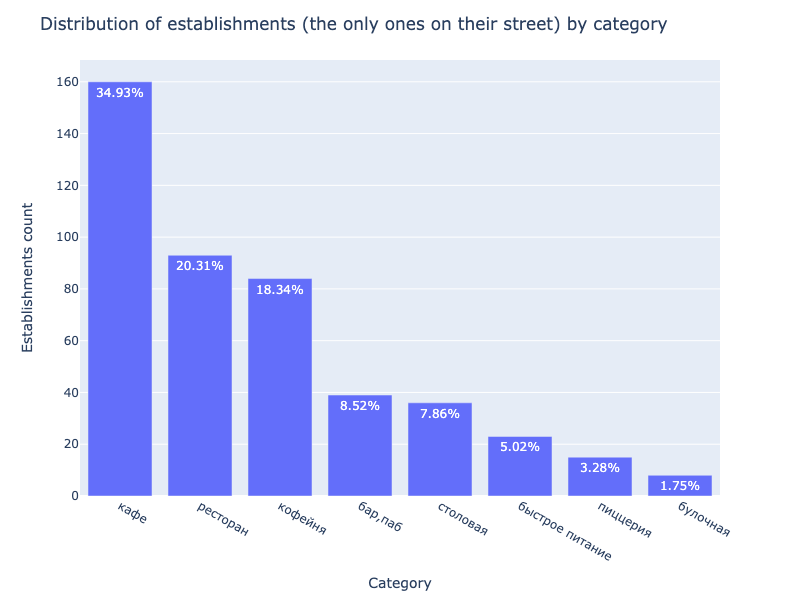

In [51]:
single_categories = (single_streets
                     .groupby('category')['name']
                     .count()
                     .sort_values(ascending=False))
fig7 = px.bar(single_categories,
              x=single_categories.index,
              y=single_categories,
              text=single_categories / sum(single_categories) * 100)
fig7.update_layout(title='Distribution of establishments (the only ones on their street) by category',
                   xaxis_title='Category',
                   yaxis_title='Establishments count',
                   width=800,
                   height=600)
fig7.update_traces(texttemplate='%{text:.2f}%', textposition='inside')
fig7.show()

The predominant category for such places is cafes, as 34.9% of them belong to this type.

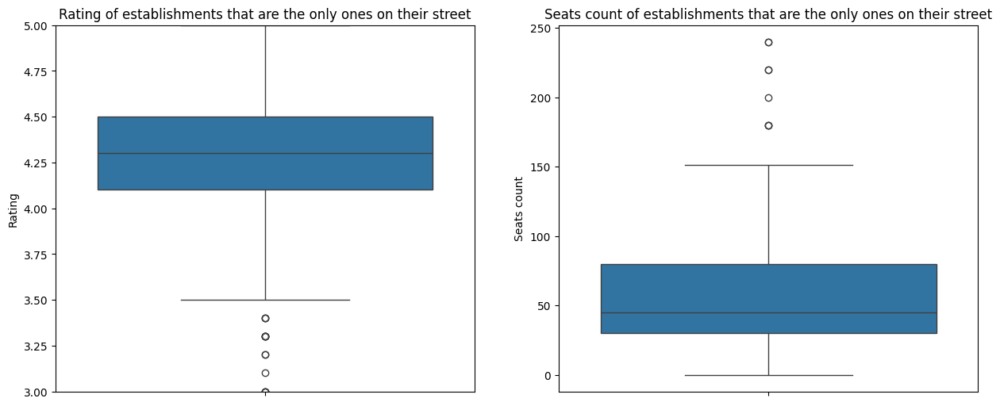

In [52]:
plt.figure(figsize=(15, 6))
sns.boxplot(data=single_streets,
            y='rating',
            ax=plt.subplot(1, 2, 1))
plt.ylim(3, 5)
plt.title('Rating of establishments that are the only ones on their street')
plt.ylabel('Rating')
sns.boxplot(data=single_streets,
            y='seats',
            ax=plt.subplot(1, 2, 2))
plt.title('Seats count of establishments that are the only ones on their street')
plt.ylabel('Seats count')
plt.show()

The median rating is slightly above 4.25. There are outliers below 3.5.

As for the number of seats, the median is just below 50, with outliers above 150.

In [53]:
f2 = Figure(width=800, height=600)
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron').add_to(f2)
marker_cluster = MarkerCluster().add_to(m2)

single_streets.apply(create_clusters, axis=1)

m2

Such establishments are more commonly found in the city center and much less frequently as you move away from it.

## Price Analysis by District

In [54]:
f3 = Figure(width=800, height=600)
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron').add_to(f3)

Choropleth(
    geo_data=state_geo,
    data=data.groupby('district', as_index=False)['middle_avg_bill'].agg('median'),
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Median prices of establishments by district',
).add_to(m3)

m3

The median price tag in the city center is the highest, ranging from 867 to 950 rubles. Next is the Western Administrative District (ЗАО), where the median bill is between 617 and 700 rubles.

Districts such as the South-Western and North-Western Administrative Districts (ЮЗАО and СЗАО) have a median price tag of 533 to 617 rubles.

Establishments in districts not part of the central and western districts have a median bill ranging from 450 to 533 rubles.

The further away from the center, the lower the average bill.

## Analysis Result

During the analysis of the data on establishments, it was found that:

- The most common categories are cafes (2377 establishments), restaurants (2041), and coffee shops (1413). Canteens and bakeries are less common (315 and 256, respectively).
- Restaurants, bars, and pubs have the largest number of seats.
- 38.1% of the establishments are part of chains.
- The most common types for chains are cafes, restaurants, and coffee shops. Among coffee shops and pizzerias, chain establishments make up more than 50%, and among bakeries, it's over 60%.
- The largest cafe chains are "Shokoladnitsa" (120 establishments), "One Price Coffee" (71), and "Cofix" (65).
- The largest pizzerias are "Domino's" and "Dodo" (76 and 74 establishments, respectively).
- The Central Administrative District (ЦАО) is the most popular district, with over 2200 establishments. In each of the other districts, there are fewer than 1000 establishments.
- On average, bars and pubs receive the highest ratings (median - 4.4).
- The district with the highest ratings is the Central Administrative District (ЦАО), with a median of 4.4. Districts such as the Southern and Northern Administrative Districts (ЮВАО and СВАО) have median ratings of around 4.2, which is the lowest among districts.
- Prospekt Mira is the busiest street in terms of establishments, with 180 establishments. There are over 120 establishments on Profsoyuznaya Street, and over 100 each on Vernadsky Avenue and Leninsky Prospekt. The other streets in the top 15 have fewer than 100 establishments.
- The Moscow Ring Road (МКАД) differs significantly in the distribution of categories, with cafes being predominant there.
- There are a total of 458 establishments represented in the data that are the only ones on their respective streets. 29% of these establishments are chain establishments. The majority (34.9%) of such establishments are cafes.
- The median price tag in the city center is the highest, ranging from 867 to 950 rubles. The further away from the center, the lower the average bill, although the western districts tend to have higher prices.

# Step 4. Research Detalization: Opening of a Coffeeshop

## Analysis

In [55]:
coffee_data = data[data['category'] == 'кофейня']
print(f'Coffeeshops in the dataset: {len(coffee_data)} ({int(len(coffee_data) / len(data) * 100)}%)')

Coffeeshops in the dataset: 1413 (16%)


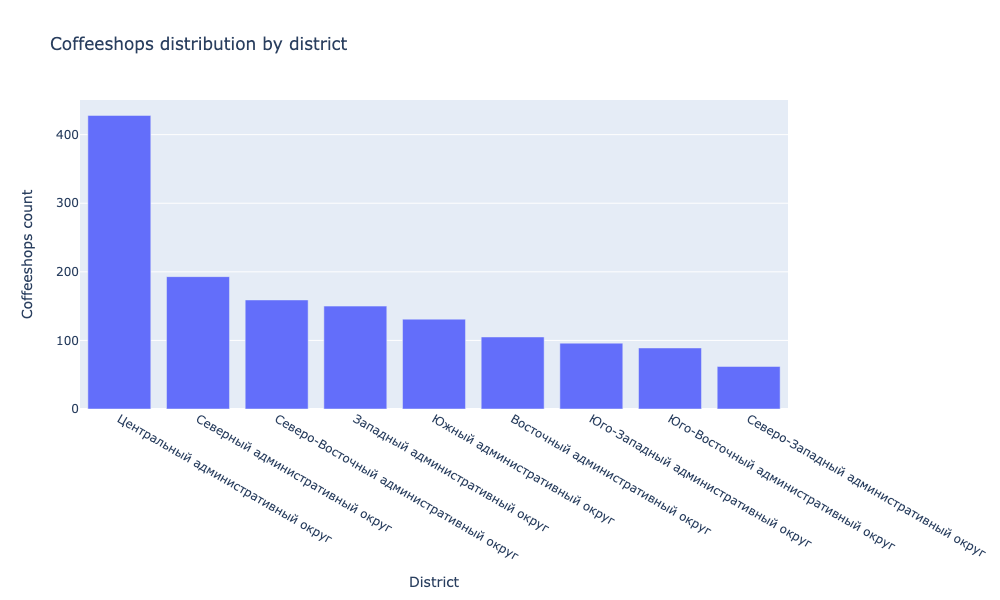

In [56]:
coffee_districts  = (coffee_data
                     .groupby('district', as_index=False)['name']
                     .count()
                     .sort_values(by='name', ascending=False))
fig8 = px.bar(coffee_districts,
              x='district',
              y='name',
              title='Coffeeshops distribution by district')
fig8.update_layout(xaxis_title='District',
                   yaxis_title='Coffeeshops count',
                   width=1000,
                   height=600)
fig8.show()


It seems that the demand for coffee is significantly higher in the city center, with over four hundred coffee shops there. In the other districts, there are fewer than 200 coffee shops, and the Southern, Southeastern, and Northwestern Administrative Okrugs have less than a hundred such establishments.

In [57]:
print(f"Number of 24/7 coffeeshops: {len(coffee_data[coffee_data['is_24/7'] == True])} ({int(len(coffee_data[coffee_data['is_24/7'] == True]) / len(coffee_data) * 100)}%)")

Number of 24/7 coffeeshops: 59 (4%)


59 coffee shops operate around the clock, which accounts for only 4% of their total number.

In [58]:
f4 = Figure(width=800, height=600)
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron').add_to(f4)

Choropleth(
    geo_data=state_geo,
    data=coffee_data.groupby('district', as_index=False)['rating'].agg('median'),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='The median rating of coffee shops by districts',
).add_to(m4)

m4

The median rating of coffee shops is evenly distributed across districts - everywhere except in the Western Administrative Okrug (ZAO), where it ranges from 4.28 to 4.3. In ZAO, however, the median rating is lower, around 4.2 to 4.22.

In [59]:
f5 = Figure(width=800, height=600)
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron').add_to(f5)

Choropleth(
    geo_data=state_geo,
    data=coffee_data.groupby('district', as_index=False)['middle_coffee_cup'].agg('median'),
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='The median pricing of coffee shops by districts',
).add_to(m5)

m5

Coffee is most expensive in the city center, where the median price for a cappuccino ranges from 175 to 185 rubles per cup. Next are the Western and Southern Administrative Okrugs (ZAO and YUZAO), where this value falls within the range of 165-175 rubles.

Districts such as the Northern and Northeastern Administrative Okrugs (SAO and SVAO) have a median price per cappuccino cup ranging from 146 to 156 rubles. In the Southern Administrative Okrug (YUAO), this figure varies from 136 to 146 rubles. Finally, in the Northwestern, Eastern, and Southeastern Administrative Okrugs (SZAO, VAO, and YUVAO), the average bill for a cappuccino is the lowest, ranging from 126 to 136 rubles.

## Analysis Results and Recommendations

During the analysis, it was established that the largest number of coffee shops are located in the city center. This may be due to the high concentration of business centers and other working locations in this district, which contribute to increased demand for coffee. Additionally, the center is the most expensive area in terms of coffee prices - the median there is 180 rubles per cup. Thus, opening a coffee shop in the center would ensure the highest revenue. However, high competition increases risks, as almost a third of all coffee shops are located in this district. It may be worth considering less crowded areas that still maintain a high average check.

The district does not have a significant impact on the median rating, except for the Western Administrative Okrug (ZAO) - coffee shops in this area are less popular.

ZAO and YUZAO have a median price tag of 170 rubles. This value is high enough to ensure high revenue. However, the ratings in ZAO are quite low, which may indicate difficulties in operating coffee shops in this district. YUZAO, on the other hand, has high median ratings, and the number of coffee shops there is less than a hundred, indicating a niche market. Additionally, high competition will not be a barrier in this district.

The idea of ​​opening a 24-hour coffee shop is not recommended, as among all establishments, this format accounts for only 4%. Presumably, demand for coffee is higher during certain hours, corresponding to the morning and lunchtime.

The final recommendation is to open a coffee shop in YUZAO with an average cappuccino price of 170 rubles. This district will provide good revenue, high ratings, and low competition.

# Step 5. Overall Conclusion and Presentation

The market of public catering in Moscow was studied as a result of data analysis. The data were preprocessed and analyzed, which allowed us to identify patterns in the location, categories, prices, and ratings of establishments. At the end of the exploratory analysis, a conclusion was drawn.

The project goals were achieved - the most advantageous location and average check for opening a coffee shop were selected. In conclusion, a final recommendation was given.

In summary, this project involved a detailed analysis of the food service sector in the capital, allowing for useful conclusions to be drawn for the subsequent opening of establishments.